# 02806 Social data analysis and visualization  
Final Project  
Xhino Mullaymeri s223471 group 57  
website: https://xhinomullaymeri.github.io/


# 1. Motivation

dataset :https://insideairbnb.com/copenhagen

## Reason behind the choice of the dataset

I chose to analyze Airbnb data from Copenhagen for two main reasons.  
First, while searching for a new apartment, I encountered Copenhagen's challenging housing market and wanted to explore if Airbnb rentals were contributing to these difficulties. Second, I was influenced by articles on how Barcelona has regulated Airbnb due to its impact on housing and how Prague’s city center has become dominated by Airbnb rentals. These cases inspired me to investigate the situation in Copenhagen.

Barcelona: https://blog.keycafe.com/understanding-barcelonas-short-term-rental-regulations/  
Prague: https://www.expats.cz/czech-news/article/prague-1-takes-a-stand-against-short-term-airbnb-rentals

## Goal for end user's experience

The objective is to provide end users with a clear understanding of Copenhagen's Airbnb landscape.  
This includes analyzing key metrics such as pricing, types of rentals, availability, and review scores. Additionally, the study aims to examine the monthly growth of Airbnb listings and their spatial distribution across the city. The analysis will also determine whether the rentals are primarily owned by individual hosts or dominated by commercial operators.

# 2. Basic stats

**Data cleaning and preprocessing**  
Step 0. Went through the dataset column dictionary to understand the data https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit#gid=1322284596  
Step 1. Kept only the columns that are relevant for the analysis  
Step 2. Removed rows with missing values


**Dataset stats**
- Number of rows: 19154 | After removing ill rows: 19153
- Number of columns: 75 -> After removing irrelevant columns: 33 -> After removing critical rows with missing values: 29

### Code

In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import json
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

# Set the font to Georgia
plt.rcParams['font.family'] = 'Georgia'

In [87]:
data = pd.read_csv(r'C:\Users\xmullaym\Desktop\listings\listings_march_2024_detailed.csv')
dataset_columns = data.columns
total_rows = len(data)

# Columns I wish I could keep. But I can't because some have too many missing values.
targeted_filtered_columns = ['id','listing_url','host_id','host_url','host_name',"host_since",'host_location','host_listings_count','host_total_listings_count','neighbourhood','neighbourhood_cleansed','latitude','longitude','property_type','room_type','accommodates','bathrooms','bedrooms','beds','amenities','price','minimum_nights','maximum_nights','has_availability','availability_365','number_of_reviews','number_of_reviews_ltm','number_of_reviews_l30d','first_review','last_review','review_scores_rating','reviews_per_month','license','calculated_host_listings_count']

# step 1: select columns of interest
filtered_data = data[targeted_filtered_columns]

# step 2: Find and remove critical rows with missing values
nan_values = filtered_data.isna().sum()

# remove columns
filtered_data.drop(columns=['license',"beds","bedrooms","bathrooms","neighbourhood"], inplace=True)

# Handling missing values

# remove row where id=13576965. Manualy checked that there is an issue with this host.
filtered_data = filtered_data[filtered_data['id'] != 13576965]

# set host_listings_count and host_total_listings_count to 1 where id=151457425. Did manual research to find this value.
filtered_data.loc[filtered_data['id'] == 1109235665140862719, 'host_listings_count'] = 1
filtered_data.loc[filtered_data['id'] == 1109235665140862719, 'host_total_listings_count'] = 1

# Infer missing values, if possible
filtered_data['has_availability'] = filtered_data['availability_365'] > 0

# fill missing values
filtered_data['host_name'] = filtered_data['host_name'].fillna('Host Name Not Available')

C:\Users\xmullaym\AppData\Local\Temp\ipykernel_7288\3943026625.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



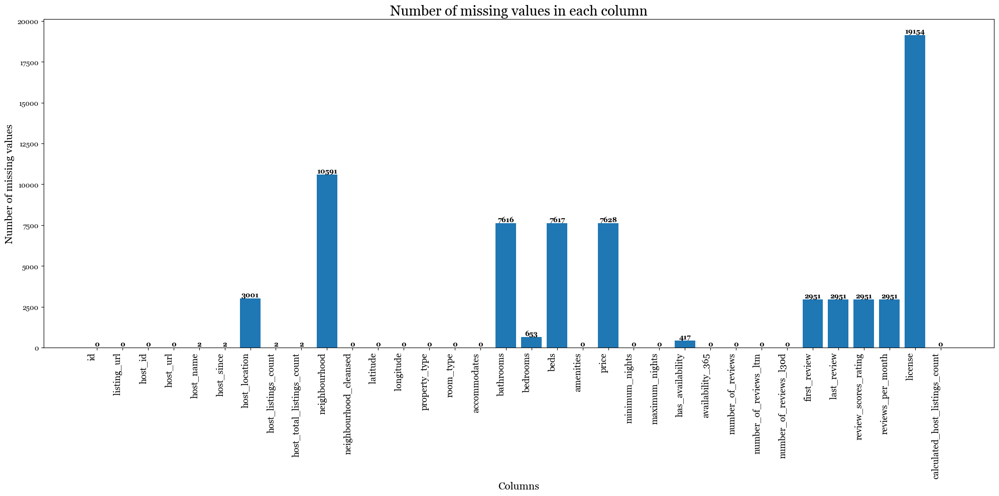

In [88]:
plt.figure(figsize=(20, 10))
bars = plt.bar(nan_values.index, nan_values.values)
plt.xticks(rotation=90)
plt.ylabel('Number of missing values', fontsize=15)
plt.xlabel('Columns', fontsize=15)
plt.title('Number of missing values in each column', fontsize=20)
plt.xticks(fontsize=13, ha='right')  # Adjust the horizontal alignment

# Include the number of missing values on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom',  # vertical alignment
             ha='center', color='black', fontweight='bold')  # horizontal alignment and style

plt.tight_layout()
plt.show()

In [89]:
print("Total rows before cleaning/filtering: ", total_rows)
print("Total rows after cleaning/filtering: ", len(filtered_data))
print("Total columns before cleaning/filtering: ", len(dataset_columns))
print("Total columns after cleaning/filtering: ", len(filtered_data.columns))

Total rows before cleaning/filtering:  19154
Total rows after cleaning/filtering:  19153
Total columns before cleaning/filtering:  75
Total columns after cleaning/filtering:  29


# 3. Data Analysis

There are three main questions that we are trying to answer with the data analysis:
1. Growth of the number of listings over time  
    Because there was no date of listing column, we will use the date of the last review as a proxy for the date of listing. There is host_since column, but a host might have joined airbnb as a user before listing their property.  
2. Spatial distribution of the listings
3. Are there airbnb tycoons or just a lot of small players?

### Code

In [90]:
#  There is no date of listing column. I will create one by considering the first review date as the date of listing.
# host_since unfortunately cannot be used as the date of listing because it is the date the host joined airbnb which
# might have happened as a user before they listed their property.

# ingore day
filtered_data['date_of_listing'] = pd.to_datetime(filtered_data['first_review']).dt.to_period('M')

# Convert Period to datetime for plotting
filtered_data['date_of_listing'] = filtered_data['date_of_listing'].dt.to_timestamp()
# store year_of_listing and cast to int
filtered_data['year_of_listing'] = pd.to_datetime(filtered_data['first_review']).dt.year

# check why some apartments do nto have a first review
filtered_data[filtered_data['first_review'].isna()]['number_of_reviews_l30d'].sum()
print("Total apartments with missing first review: ", len(filtered_data[filtered_data['first_review'].isna()]))
print("Total reviews for apartments with missing first review: ", filtered_data[filtered_data['first_review'].isna()]['number_of_reviews'].sum())
print("Availability for apartments with missing first review: ", (filtered_data[filtered_data['first_review'].isna()]['availability_365']>70).sum())

Total apartments with missing first review:  2950
Total reviews for apartments with missing first review:  0
Availability for apartments with missing first review:  1358


This means that there are 2950-2146 = 804 listings that are listed, have never had a review and are not available for the following 365 days.  
It also means that there are 2146 apartments with no review but have at list 1 available day the following 365 days.  

In [91]:
# show the number of reviews for apartments with missing first review and availability_365 ==1
# These are the very short term rentals
filtered_data[
    (filtered_data['first_review'].isna()) & 
    (filtered_data['availability_365'] > 0) & 
    (filtered_data['availability_365'] <= 31)
][['listing_url', 'availability_365']]

,listing_url,availability_365
4,https://www.airbnb.com/rooms/1113722678442011271,14
27,https://www.airbnb.com/rooms/1120367497541574806,15
29,https://www.airbnb.com/rooms/927963137660269012,14
71,https://www.airbnb.com/rooms/795635278897625249,31
85,https://www.airbnb.com/rooms/771468375676810399,18
...,...,...
18787,https://www.airbnb.com/rooms/918164669956317855,1
18935,https://www.airbnb.com/rooms/922462228334836186,1
19061,https://www.airbnb.com/rooms/1007712699351252941,1
19072,https://www.airbnb.com/rooms/1073077184036829879,2


In [92]:
# Group by date_of_listing and count the number of listings on that date
grouped_data = filtered_data.groupby('date_of_listing').count()

fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces with markers
fig.add_trace(
    go.Scatter(
        x=grouped_data.index,
        y=grouped_data['id'],
        name="Number of listings",
        mode='lines+markers',  # Combine lines and markers
        marker=dict(size=5),  # Adjust size for visibility
    ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(
        x=grouped_data.index,
        y=grouped_data['id'].cumsum(),
        name="Cumulative number of listings",
        line=dict(color='red'),
        mode='lines+markers',  # Combine lines and markers
        marker=dict(size=5, color='red'),  # Red markers to match the line
    ),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Number of listings per month and cumulative number of listings",
    title_font_size=20,
    title_x=0.5,  # Centers the title by setting its x-position to 50%
    title_xanchor='center'  # Ensures the title's anchor is at the center
)

# Set x-axis title
fig.update_xaxes(title_text="Date of listing", tickformat="%Y-%m", tickangle=-45)

# Set y-axes titles
fig.update_yaxes(title_text="Number of listings",  title_font=dict(color='blue'), tickfont=dict(color='blue'), secondary_y=False)
fig.update_yaxes(title_text="Cumulative number of listings", title_font=dict(color='red'), tickfont=dict(color='red'), secondary_y=True)

# set every year x axis
fig.update_xaxes(tick0='2020-01-01', dtick='M12')


# Adding a shaded region for specific dates
fig.add_vrect(x0="2020-01-01", x1="2022-04-30", fillcolor="grey", opacity=0.35, line_width=0)

# Calculate the mid-point of the y-data range
y_mid_point = (grouped_data['id'].cumsum().max() + grouped_data['id'].cumsum().min()) / 17

# Add annotation at the calculated mid-point
fig.add_annotation(
    x=pd.Timestamp('2021-02-01'),
    y=y_mid_point,
    text="COVID-19 Pandemic Effects",
    showarrow=False,
    font=dict(size=12, color='black')
)

# remove yaxis grid
fig.update_yaxes(showgrid=False)

# Adjust layout and size
fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    margin=dict(l=30, r=30, b=20, t=50, pad=4),
)

# move legend
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))

# Show plot
fig.show()

It's evident that the number of listings has been increasing over time.  
There is a period of two years where the number of listings is not increasing rapidly and the reason for this is covid-19.  
The past two years there is a huge increase in the number of listings, more or less 3x the number of listings in 2019.



In [93]:
# remove nan in year_of_listing
filtered_data_no_nans = filtered_data.dropna(subset=['year_of_listing'])
filtered_data_no_nans=filtered_data_no_nans[["id",'year_of_listing','latitude','longitude','neighbourhood_cleansed','date_of_listing','listing_url','host_id','host_url','host_name','price','review_scores_rating']]
filtered_data_no_nans['year_of_listing'] = filtered_data_no_nans['year_of_listing'].astype(str).str.split('.').str[0]
filtered_data_no_nans['price'] = filtered_data_no_nans['price'].str.replace('$', '').str.strip() + ' dkk'


In [94]:
# load geojson file
geojson_path = r"D:\Projects\social_data_2024\socialdata2024\final_project_images\neighbourhoods.geojson"
with open(geojson_path) as f:
    geojson = json.load(f)

# group by first by year then by neighbourhood_cleansed
agg_year_neighbourhood = filtered_data_no_nans.groupby(['year_of_listing','neighbourhood_cleansed']).size().reset_index(name='listings_count')

# Create the figure
fig = px.choropleth_mapbox(agg_year_neighbourhood, geojson=geojson, locations="neighbourhood_cleansed", color='listings_count',animation_frame="year_of_listing",
                           color_continuous_scale="Viridis",
                           featureidkey="properties.neighbourhood",
                           range_color=(agg_year_neighbourhood['listings_count'].min(), agg_year_neighbourhood['listings_count'].max()),
                           mapbox_style="open-street-map",
                           zoom=10.9, center = {"lat": 55.675643, "lon": 12.53577},
                           opacity=0.7
                          )

# Iterate over each year and prepare a scatter plot trace for each
scatter_traces = {}
for year in filtered_data_no_nans['year_of_listing'].unique():
    year_data = filtered_data_no_nans[filtered_data_no_nans['year_of_listing'] == year]

    scatter_traces[str(year)] = go.Scattermapbox(
        lat=year_data['latitude'],
        lon=year_data['longitude'],
        mode='markers',
        marker=dict(size=6, color='red', opacity=0.7),
        customdata=year_data['listing_url'],  # Store URLs in customdata
        text=year_data.apply(
            lambda row: (
                f"<b>Host:</b> {row['host_name']}<br>"
                f"<b>Since:</b> {str(row['date_of_listing']).split()[0]}<br>"
                f"<b>Neighbourhood:</b> {row['neighbourhood_cleansed']}<br>"
                f"<b>Price:</b> {row['price']}<br>"
                f"<b>Review score:</b> {row['review_scores_rating']}<br>"
                "Click for more."
            ), axis=1),
        hoverinfo='text'
    )


# Add the scatter traces to the respective frames
str_scatter_traces_keys = [str(item) for item in list(scatter_traces.keys())]
for frame in fig.frames:
    if frame.name in scatter_traces:
        frame.data += (scatter_traces[frame.name],)  

fig.update_layout(
    margin={"r":2, "t":30, "l":2, "b":0},
    title_text='Listings per year and exact locations.',
    font_family="Georgia",
    title_font_family="Georgia",
    title_x=0.5,  # Centers the title by setting its x-position to 50%
    title_xanchor='center'  # Ensures the title's anchor is at the center
)
fig.update_layout(
    autosize=False,
    width=800,  
    height=800 
)

fig.add_traces(scatter_traces["2010"])

fig.write_html(r"D:\Projects\social_data_2024\socialdata2024\final_project_images\Listings per neighbourhood.html", full_html=True, include_plotlyjs='cdn')
fig.show()



As expected, the majority of the listings are located in the city center.

In [95]:
agg_host_id = filtered_data_no_nans.groupby(['host_id']).size().reset_index(name='listings_count')
# sort agg_host_id
agg_host_id = agg_host_id.sort_values(by='listings_count', ascending=False)
frequency = agg_host_id['listings_count'].value_counts().sort_index()


In [96]:
# Assuming frequency is already calculated using value_counts() and sorted.
fig = px.bar(
    x=frequency.index,  # Ensure these are the x values you want (unique, existing values)
    y=frequency.values,
    labels={'x': 'Number of listings', 'y': 'Number of hosts'},
    title='Number of hosts having a certain number of listings'
)

# Set the x-axis to treat each value as a distinct category
fig.update_layout(
    xaxis=dict(
        type='category',  # This treats the x values as categorical, not numerical
        title='Number of listings'
    ),
    yaxis_title='Number of hosts',
    font=dict(family="Georgia")
)

# y axis log
fig.update_yaxes(type="log")

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),
    title={
        'text': 'Number of hosts having a certain number of listings',
        'y': 0.95,  # Adjust the vertical position if needed
        'x': 0.5,  # Centers the title
        'xanchor': 'center',  # Ensures the title will be centered at the specified x position
        'yanchor': 'top'  # Anchors the title at the top of the plot area
    },
    font=dict(family="Georgia"),
    xaxis_title='Number of listings',
    yaxis_title='Number of hosts'
)

# dashed line at 5.5
fig.add_shape(
    type="line",
    x0=4.5,
    y0=1,
    x1=4.5,
    y1=10000,
    line=dict(
        color="red",
        width=2,
        dash="dash"
    )
)

# legend dashed line is threshold for tycoons
fig.add_annotation(
    x=4.45,
    y=3,
    text="Tycoons?",
    showarrow=True,
    font=dict(
        family="Georgia",
        size=20,
        color="red",
        # bold
        
    )
)

fig.show()

Should manually check whether hosts that have multiple listings are commercial operators or individual hosts.

In [97]:
# show host_id with more than 5 listings
agg_host_id_over_5 = agg_host_id[agg_host_id['listings_count'] >= 6]
# get host names of hosts with more than 6 listings
host_names = filtered_data_no_nans[filtered_data_no_nans['host_id'].isin(agg_host_id_over_5['host_id'])]
host_names = host_names[['host_id', 'host_name',"listing_url","host_url"]].drop_duplicates()
host_names = host_names.drop_duplicates(subset=['host_id'])
# add listings_count
host_names = host_names.merge(agg_host_id_over_5, on='host_id', how='inner')
# sort based on listings_count
host_names = host_names.sort_values(by='listings_count', ascending=False)
host_names

,host_id,host_name,listing_url,host_url,listings_count
3,187610263,ApartmentinCopenhagen,https://www.airbnb.com/rooms/1014416187048880317,https://www.airbnb.com/users/show/187610263,150
7,437864658,Sanders,https://www.airbnb.com/rooms/968647013656570457,https://www.airbnb.com/users/show/437864658,37
6,179753578,Carolinas Apartments,https://www.airbnb.com/rooms/962753925142779422,https://www.airbnb.com/users/show/179753578,28
17,244829847,Daniel And Jacobs Apartments,https://www.airbnb.com/rooms/49236934,https://www.airbnb.com/users/show/244829847,18
20,155348640,Forenom Denmark,https://www.airbnb.com/rooms/30160025,https://www.airbnb.com/users/show/155348640,17
25,24943487,Cheryl,https://www.airbnb.com/rooms/43447823,https://www.airbnb.com/users/show/24943487,17
34,3366007,Daniel And Jacobs,https://www.airbnb.com/rooms/27915769,https://www.airbnb.com/users/show/3366007,15
23,164771007,Reception,https://www.airbnb.com/rooms/47806770,https://www.airbnb.com/users/show/164771007,14
26,247379882,Edward,https://www.airbnb.com/rooms/601302730873506937,https://www.airbnb.com/users/show/247379882,14
4,423682853,City Square,https://www.airbnb.com/rooms/54271491,https://www.airbnb.com/users/show/423682853,12


Manually checked each one of them and only the following ids seem to be idividuals with multiple listings. The rest are either companies or people who manage multiple listings for others.
- host_id: 339983201
- host_id: 31867239
- host_id: 270262991
- host_id: 10025274


### Miscellaneous analysis

In [98]:
# distribution of prices with plotly
filtered_data_no_nans['price'] = filtered_data_no_nans['price'].str.replace('$', '').str.strip() + ' dkk'
filtered_data_no_nans['price'] = filtered_data_no_nans['price'].str.replace(',', '').str.strip()
filtered_data_no_nans['price'] = filtered_data_no_nans['price'].str.replace(' dkk', '').str.strip()
filtered_data_no_nans['price'] = filtered_data_no_nans['price'].astype(float)

# sort by price
filtered_data_no_nans = filtered_data_no_nans.sort_values(by='price', ascending=False)
filtered_data_no_nans

# drop id 855445122640003908 , 44226456 because seem not real
filtered_data_no_nans = filtered_data_no_nans[filtered_data_no_nans['id'] != 855445122640003908]
filtered_data_no_nans = filtered_data_no_nans[filtered_data_no_nans['id'] != 44226456]
filtered_data_no_nans = filtered_data_no_nans[filtered_data_no_nans['id'] != 14275808]


In [99]:
# boxplot of prices
fig = px.box(filtered_data_no_nans, x='year_of_listing', y='price', title='Price distribution per year')
fig.update_layout(
    title={
        'text': 'Price distribution per year',
        'y': 0.95,  # Adjust the vertical position if needed
        'x': 0.5,  # Centers the title
        'xanchor': 'center',  # Ensures the title will be centered at the specified x position
        'yanchor': 'top'  # Anchors the title at the top of the plot area
    },
    font=dict(family="Georgia"),
    xaxis_title='Year of listing',
    yaxis_title='Price in dkk'
)

# sort x axis
fig.update_xaxes(categoryorder='category ascending')

# log y
fig.update_yaxes(type="log")

fig.show()

Interesting that median q1 and q3 of new listings remain the same through the years.

Creating one plot with miscallenous analysis

In [100]:
fig1 = go.Figure()

# Step 1: Prepare the data
prices = filtered_data_no_nans['price']
price_counts = prices.value_counts().sort_index()
cumulative_counts = price_counts.cumsum()

# Step 2: Calculate cumulative percentages
total_listings = prices.count()
cumulative_percentages = (cumulative_counts / total_listings) * 100

# Step 3: Create the plot
fig1 = go.Figure()
fig1.add_trace(go.Histogram(
    x=prices,
    nbinsx=50,
    marker_color='blue',
    opacity=0.5,
    name='Price Distribution'
))
fig1.add_trace(go.Scatter(
    x=cumulative_counts.index,  
    y=cumulative_percentages,  
    mode='lines+markers',
    name='Cumulative Percentage ≤ Price',
    yaxis='y2' ,
    line=dict(color='blue')
))

# Step 4: Update layout to include a secondary y-axis
fig1.update_layout(
    title='Price Distribution with Cumulative Percentages',
    xaxis_title='Price',
    yaxis_title='Number of Listings',
    yaxis_type='log',  
    yaxis2=dict(
        title='Cumulative Percentage',
        overlaying='y',
        side='right',
        range=[0, 100],  
        tickformat='%.0f%%'  
    ),
    legend=dict(
        x=0.1,
        y=0.1,
        orientation='h'  
    )
)

# tight
fig1.update_layout(margin=dict(l=20, r=20, t=50, b=20))



In [101]:
# Assuming room_counts is defined
room_counts = filtered_data['room_type'].value_counts()

# Define a list of brown tones
brown_colors = ['#FFECB3', '#B2EBF2','#A1887F',  '#E1BEE7', '#CFD8DC']

fig2 = go.Figure(go.Pie(
    labels=room_counts.index,
    values=room_counts.values,
    hoverinfo='label+percent', 
    textinfo='percent+label',
    marker=dict(colors=brown_colors),  # Apply the brown color palette
    rotation=120,
    opacity=0.8
))

# Update the layout and center the title
fig2.update_layout(
    title={
        'text': 'Room Type Distribution',
        'y': 0.95, 
        'x': 0.5,  
        'xanchor': 'center',  
        'yanchor': 'top'  
    },
    font=dict(family="Georgia"),
)

# Update hover template
fig2.update_traces(
    hovertemplate='%{label}: %{value} (<b>%{percent}</b>)'
)


In [102]:
# Prepare the data
availability_days = filtered_data['availability_365']
availability_counts = availability_days.value_counts().sort_index()
cumulative_counts = availability_counts.cumsum()

# Calculate cumulative percentages
total_listings = availability_days.count()
cumulative_percentages = (cumulative_counts / total_listings) * 100

# Create the histogram for availability
fig3 = go.Figure()
fig3.add_trace(go.Histogram(
    x=availability_days,
    nbinsx=52,
    marker_color='green',
    opacity=0.5,
    name='Availability Distribution'
))

# Add a trace for cumulative percentages
fig3.add_trace(go.Scatter(
    x=cumulative_counts.index,  
    y=cumulative_percentages,   
    mode='lines+markers',
    name='Cumulative Percentage ≤ Days',
    yaxis='y2' ,
    line=dict(color='green')
))

# Update layout to include a secondary y-axis
fig3.update_layout(
    title='Availability (Days per Year) with Cumulative Percentages',
    xaxis_title='Days Available',
    yaxis_title='Number of Listings',
    yaxis_type='log',  
    yaxis2=dict(
        title='Cumulative Percentage',
        overlaying='y',
        side='right',
        range=[0, 100],  
        tickformat='%.0f%%'  
    ),
    legend=dict(
        x=0.5,
        y=1.1,
        orientation='h' 
    )
)

In [103]:
# Prepare the data
review_scores_rating = filtered_data['review_scores_rating']
review_scores_rating_counts = review_scores_rating.value_counts().sort_index()
cumulative_counts = review_scores_rating_counts.cumsum()

# Calculate cumulative percentages
total_listings = review_scores_rating.count()
cumulative_percentages = (cumulative_counts / total_listings) * 100

# Create the histogram for availability


fig4 = go.Figure()
fig4.add_trace(go.Histogram(
    x=review_scores_rating,
    nbinsx=20,
    marker_color='purple',
    opacity=0.5,
    name='Review Scores Distribution'
))

fig4.add_trace(go.Scatter(
    x=cumulative_counts.index,  
    y=cumulative_percentages,   
    mode='lines+markers',
    name='Cumulative Percentage ≤ Review Score',
    yaxis='y2'  # Links this trace to the secondary y-axis
))

# Update layout to include both axes and remove unnecessary grid lines
fig4.update_layout(
    title='Review Scores Distribution with Cumulative Percentages',
    xaxis_title='Review Score',
    xaxis=dict(
        range=[1, 5]  # Ensure the range is appropriate for your data
    ),
    yaxis=dict(
        title='Number of Listings',
        type='log',
        showgrid=False  # Disables horizontal grid lines for the primary y-axis
    ),
    yaxis2=dict(
        title='Cumulative Percentage',
        side='right',
        overlaying='y',
        range=[0, 100],
        tickformat='%.0f%%',
        showgrid=False  # Disables horizontal grid lines for the secondary y-axis
    ),
    legend=dict(
        x=0.5,
        y=1.1,
        orientation='h'
    )
)



In [106]:

# Create the subplot framework as you've done before
final_fig = make_subplots(
    rows=2, cols=2,
    specs=[
        [{"type": "xy", "secondary_y": True}, {"type": "pie"}], 
        [{"type": "xy", "secondary_y": True}, {"type": "xy", "secondary_y": True}]
    ],
    subplot_titles=("Price Distribution", "Room Type Chart", "Availability (Days per Year)", "Review Scores Distribution"),
    vertical_spacing=0.2,  
    horizontal_spacing=0.1  
)

# Add the histograms and pie chart to the appropriate locations
# For the primary y-axis
final_fig.add_trace(fig1.data[0], row=1, col=1, secondary_y=False)
# For the secondary y-axis
final_fig.add_trace(fig1.data[1], row=1, col=1, secondary_y=True)

# Assuming fig2 is your pie chart and fig3 contains both a histogram and a cumulative line
final_fig.add_trace(fig2.data[0], row=1, col=2)
final_fig.add_trace(fig3.data[0], row=2, col=1, secondary_y=False)
final_fig.add_trace(fig3.data[1], row=2, col=1, secondary_y=True)

# Assuming fig4 is your histogram with cumulative line
final_fig.add_trace(fig4.data[0], row=2, col=2, secondary_y=False)
final_fig.add_trace(fig4.data[1], row=2, col=2, secondary_y=True)


# Update layout (optional tweaks)
final_fig.update_yaxes(title_text="Number of Listings", row=1, col=1, secondary_y=False, type='log', showgrid=False)
final_fig.update_yaxes(title_text="Cumulative % Price", row=1, col=1, secondary_y=True, showgrid=False)
final_fig.update_yaxes(title_text="Number of Listings", row=2, col=1, secondary_y=False, type='log', showgrid=False)
final_fig.update_yaxes(title_text="Cumulative % Availability", row=2, col=1, secondary_y=True, showgrid=False)
final_fig.update_yaxes(title_text="Number of Listings", row=2, col=2, secondary_y=False, type='log', showgrid=False)
final_fig.update_yaxes(title_text="Cumulative % Review Score", row=2, col=2, secondary_y=True, showgrid=False)

# xaxis
final_fig.update_xaxes(title_text="Price dkk", row=1, col=1)
final_fig.update_xaxes(title_text="Room Type", row=1, col=2)
final_fig.update_xaxes(title_text="Availability (Days)", row=2, col=1)
final_fig.update_xaxes(title_text="Review Score", row=2, col=2)


# Update layout with explicit legend settings
final_fig.update_layout(
    font=dict(
        family="Georgia",
        size=12,
        color="black"
    ),
    title=dict(
        text='Varius distributions of the data', 
        x=0.5,  
        xanchor='center',  
        y=0.95,  
        yanchor='top' 
    ),
    height=800,
    margin=dict(l=40, r=0, t=100, b=20),
    showlegend=True,  
    legend=dict(
        orientation="h",  
        x=0.5,  
        xanchor="center", 
        y=0.55,  
        yanchor="top",
        font=dict(family="Georgia"),  
        itemsizing='constant',  
        traceorder='normal',
        tracegroupgap=5,  
        borderwidth=1  
    ),

)

final_fig.for_each_annotation(lambda a: a.update(font=dict(family="Georgia")))

final_fig.update_xaxes(title_standoff=5)
final_fig.update_yaxes(title_standoff=5)


# Show the final combined figure
final_fig.show()

# 4. Genre

For the communication of the results, I used a magazine-style genre to make the analysis more engaging and easier to understand.  

Visual Narrative tools:
* Visual structuring of the analysis: The analysis is structured in a way that is easy to follow.
    - Consistent visual platform is used to present the analysis. The analysis uses similar colors, fonts, and styles to present the information. 
* Highlighting: The most important information is highlighted.
    - Zooming in on the plots is used to highlight the most important information.
    - Hovering info is provided for all the plots to highlight the most important information.
    - Feature distinction is used to highlight the most important information. Different colors are used to distinguish between different types of listings and not only.
* Transition guidance
    - Animated plots are used to show the distribution of the listing to Copenhagen over time.

Narrative structure:
* Ordering: The analysis is ordered in a logical way.
    - Linear narrative structure is used to present the analysis. The analysis starts with the introduction of the dataset and the motivation behind the analysis. Then, the analysis is divided into three main sections: Growth of the number of listings over time, Spatial distribution of the listings, and Are there airbnb tycoons or just a lot of small players? Each section is introduced with a headline and a brief explanation of what will be analyzed. The analysis is concluded with a miscellaneous analysis section that presents additional insights.
* Interactivity: The reader can interact with the plots to get more information.
    - Hovering info are provided for all the plots. In order users to be able to see the exact values of the plots and details from the plots.
    - Click and redirect to the airbnb listing page for each listing is provided on the map plot.
    - Selection of cumulative function for all the shown distributions is provided in order to see the cumulative distribution of the data.
* Messaging: The analysis is clear and easy to understand.
    - Headlines are used to introduce the different sections of the analysis.
    - Captions are used to explain the plots.
    - Accompaning articles are mentioned to provide more information.

# 5. Visualizations

# 6. Discussion

### What went well?


The analysis achieves its objectives to a considerable extent. It successfully demonstates the growth in the number of listings over time and effectively visualizes their spatial distribution across Copenhagen. Furthermore, the study reveales only a handful hosts who manage multiple listings are not commercial operators. It also highlighted that the majority of listings are concentrated in the city center (as expected).

The highlight of the project is the spatial distribution visualization. This feature clearly displays the location and density of listings within each area (every year) in a dynamic 'video' format, complete with click-to-redirect functionality.

Overall, users navigating through the website will gain a comprehensive understanding of the Airbnb landscape in Copenhagen, which aligns with the primary aim of this project

### What is still missing? What could be improved?, Why?


The project currently lacks depth, which could be enhanced by integrating additional data sources.  Even though that a considerable amount of time was spent in a research of an enhancing dataset, nothing fruitful was found.  

Another idea to investigate, was the impact of Airbnb listings on Copenhagen’s housing crisis, specifically in terms of rental prices and availability. However, rental price fluctuations are influenced by a variety of factors, making it challenging to isolate the impact solely attributable to Airbnb.

The dataset in use has significant limitations; it is unofficial and lacks crucial details such as exact addresses and actual listing dates, and contains numerous missing values. I also was particularly interested in exploring the availability patterns of the listings throughout the year to understand peak rental periods. However, gathering this data is complicated by the difficulties associated with scraping Airbnb’s website.

Lastly, the project's organization could have been better (by my side). Due to other commitments as an industrial MSc student, the project was rushed and could have been much more refined if more time had been available.

# 7. Contributions

**Xhino Mullaymeri s223481 100%**

# 8. References

Segel, E., & Heer, J. (2010). Narrative Visualization: Telling Stories with Data. IEEE Transactions on Visualization and Computer Graphics, 16(6), 1139-1148.

Dataset: https://insideairbnb.com/copenhagen